# Traffic lane detection
In this assignment, you will use image processing techniques and the Hough Transform to identify traffic lanes in a series of test images and video sequences\

There are 5 sets of images in total. Start with set 1, and then review the other sets (some are more difficult than others)

## Submission Details
Assignment deadline: Midnight, Tuesday 14th March \
Jupyter Notebook containing submission to be submitted via blackboard \
Total grade: 10% of final module mark

# Please include your name and student ID in the submitted file name!

# Submission details
### Name: Smitesh Nitin Patil
### ID: 22223696
### Class code: 1CSD

In [1]:
# install required libraries
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import os
import random
%matplotlib inline


## Load test images


In [2]:
# read images
input_path = 'images/set_1/'
filenames = [input_path + filename for filename in os.listdir(input_path)]
raw_images = [cv2.imread(filename) for filename in filenames]
count = len(raw_images)

print(count)

6


## Convert the images to greyscale

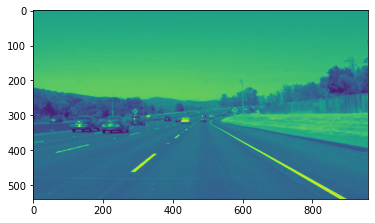

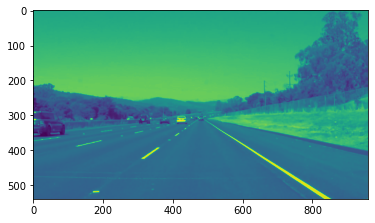

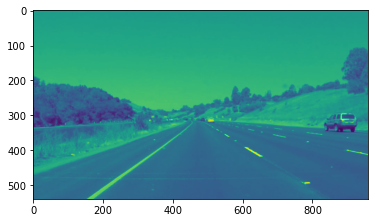

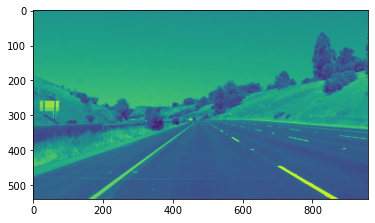

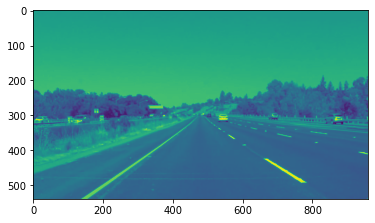

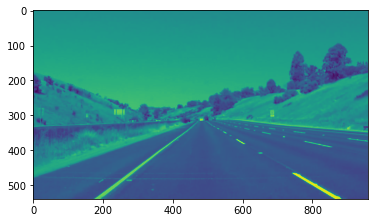

In [3]:
# take all the images in the list and create a list of greyscale images

grey_images = []

# code: populate grey_images as a list of greyscale images

grey_images = [cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) for image in raw_images]

# plot the image to confirm 
for image in grey_images:
    plt.imshow(image)
    plt.show()

## Apply Gaussian blur
Gaussian blur reduces noise and weak edges. In principle, only sharper, more defined edges (i.e. road markings) will remain\

The image should look something like the example below:
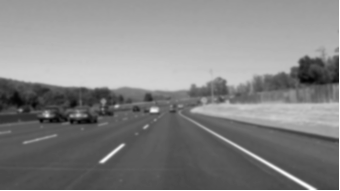

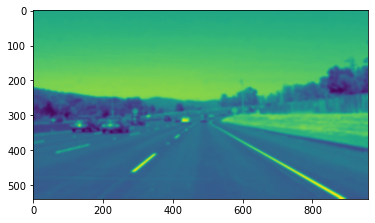

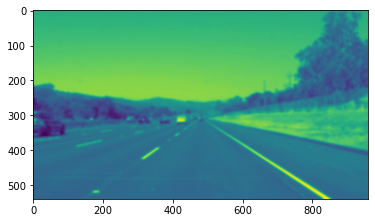

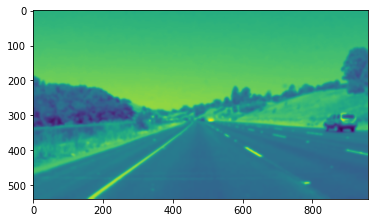

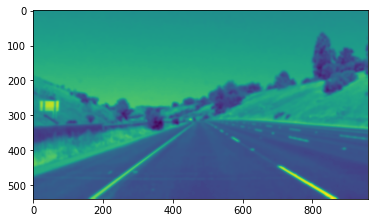

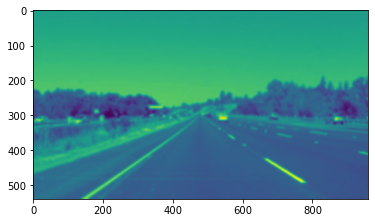

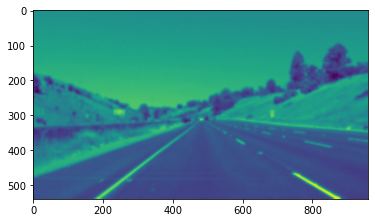

In [4]:
# define the blur kernel size. Hint: a kernal size of 15 works fairly well
kernel_size = (15, 15)

blur_images = []
# blur all of the images with opencv's gaussian blur function and populate the blur_images list with the results

img_blur = [cv2.GaussianBlur(img_gray, kernel_size, 0) for img_gray in grey_images]
#display blurred images

for image in img_blur:
    plt.imshow(image)
    plt.show()

## Detect edges
The next step is to detect edges in the image. In general, the Canny edge detector works well for this operation\

The result should look something like the example below:
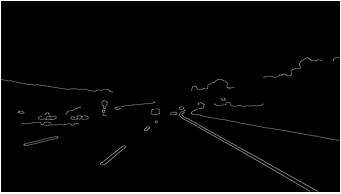

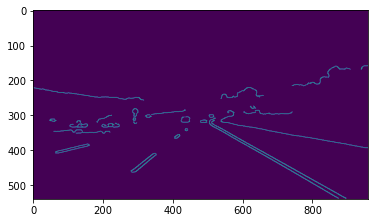

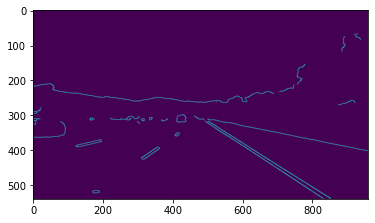

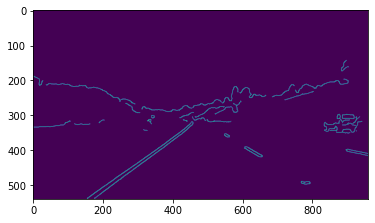

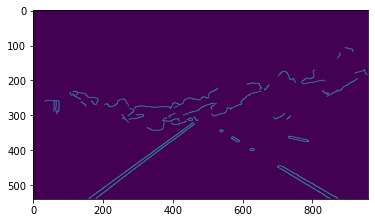

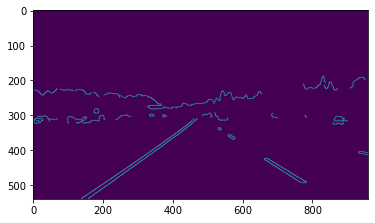

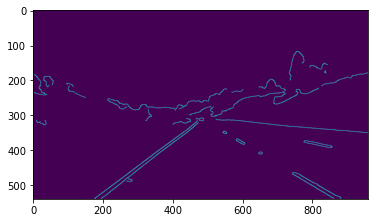

In [6]:
# define edge thresholds. Note: these thresholds may need to be adjusted for different scenarios.
# hint: 20 and 100 work well for the first set (but not necessarily all...)
canny_low_threshold = 20
canny_high_threshold = 100

# apply edge detection to the blur_images list of images
canny_images = [cv2.Canny(img_threshold, 20, 100) for img_threshold in img_blur]

#display edge images
for img in canny_images:
    plt.imshow(img)
    plt.show()

## Define region of interest
We only want to look for edges in the road in front of the camera, and we want to ignore edges in the sky, background etc. To do this, we will define a region of interest. All edges outside the region of interest are ignored

The result should look something like this example, where most of the background has been ignored:
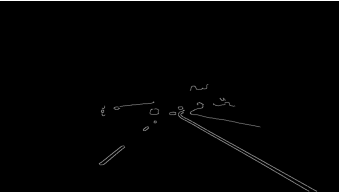


In [12]:
# Note: use this code as is, there is no need to change

# define a region of interest mask
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon defined by "vertices". 
    The rest of the image is set to black.
    """
    #define a blank mask
    mask = np.zeros_like(img)   
    
    #define a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

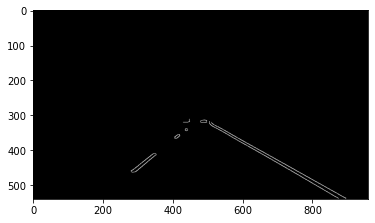

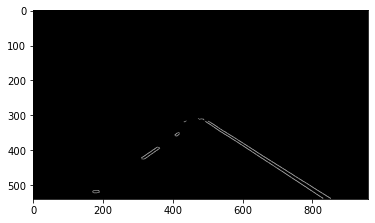

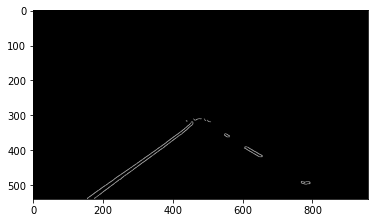

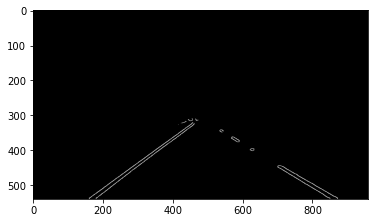

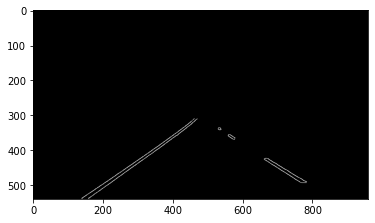

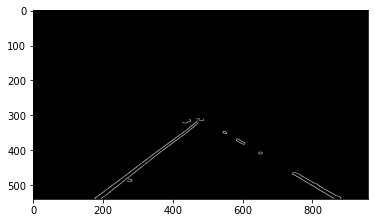

In [43]:
# get the size and shape of one of the images
ysize = raw_images[0].shape[0]
xsize = raw_images[0].shape[1]

# define region of interest. The region of interest should include the road area and ignore the background
# the coordinates will need to be changed, depending on the image set used, as the field of view will be different
# define the region as a numpy array, of type np.int32

vertices = np.array([[(0,raw_images[0].shape[0]),(450, 310), (490, 310), (raw_images[0].shape[1],raw_images[0].shape[0])]], dtype=np.int32)

# apply the mask to the Canny edge images
masked_images = [region_of_interest(img ,vertices) for img in canny_images]

#display ROI images

for img in masked_images:
    plt.imshow(img, cmap = 'Greys_r')
    plt.show()

## Apply Hough Transform
We will use the Hough Transform to detect lines in the image

You should expect to see something that looks like this:
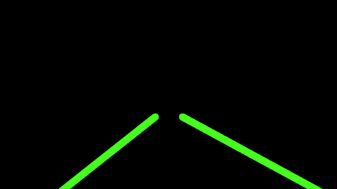

In [49]:
# Define helper function to draw the lines detected by the Hough Transform

# Note: for the basic assignment, you can use these functions as is, with no updates. For extra credit marks, 
# these functions will need to be updated


# helper function - fit a line to the Hough tranform coordinates, and plot on the image
def drawLine(img, x, y, color=[0, 255, 0], thickness=20):
    if len(x) == 0: 
        return
    
    lineParameters = np.polyfit(x, y, 1) 
    
    m = lineParameters[0]
    b = lineParameters[1]
    
    maxY = img.shape[0]
    maxX = img.shape[1]
    y1 = maxY
    x1 = int((y1 - b)/m)
    y2 = int((maxY/2)) + 60  # note: hardcoded, sets the length of the line to half the image height + 60 pixels
    x2 = int((y2 - b)/m)
    cv2.line(img, (x1, y1), (x2, y2), color, thickness)


# Helper function - split the detected lines into left and right lines
def draw_lines(img, lines, color=[0, 255, 0], thickness=20):

    leftPointsX = []
    leftPointsY = []
    rightPointsX = []
    rightPointsY = []

    for line in lines:
        for x1,y1,x2,y2 in line:
            m = (y1 - y2)/(x1 - x2)
            
                        
            if m < 0:
                leftPointsX.append(x1)
                leftPointsY.append(y1)
                leftPointsX.append(x2)
                leftPointsY.append(y2)
            else:
                rightPointsX.append(x1)
                rightPointsY.append(y1)
                rightPointsX.append(x2)
                rightPointsY.append(y2)

    drawLine(img, leftPointsX, leftPointsY, color, thickness)
        
    drawLine(img, rightPointsX, rightPointsY, color, thickness)



In [50]:
# define a function - calculate Hough lines based on the Canny images, and draw them on the output image

# use the opencv cv2.HoughLinesP to calculate the Hough lines in the image (i.e. to detect the lanes)

def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap) 
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    draw_lines(line_img, lines)
    return line_img

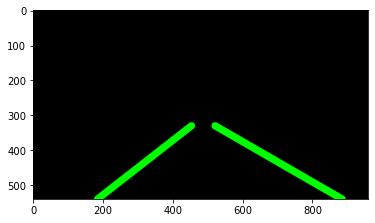

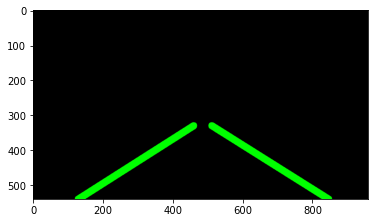

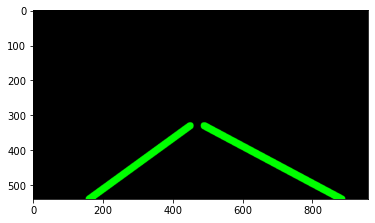

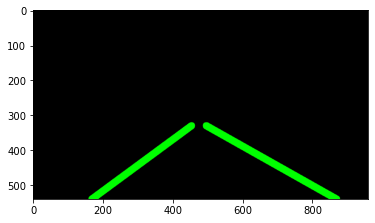

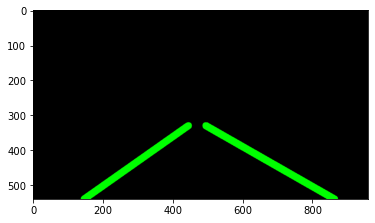

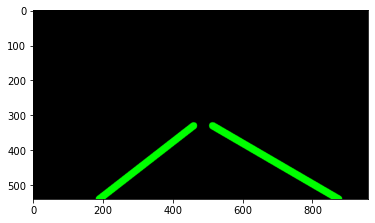

In [51]:
# define the parameters for the Hough line detector. The default values work reasonably well

rho = 1 # distance resolution in pixels of the Hough grid
theta = np.pi/180 # angular resolution in radians of the Hough grid
threshold = 10     # minimum number of votes (intersections in Hough grid cell)
min_line_length = 20 # minimum number of pixels making up a line
max_line_gap = 1    # maximum gap in pixels between connectable line segments

hough_images = [hough_lines(img,rho,theta,threshold,min_line_length,max_line_gap) for img in masked_images]


#display Hough line images
for img in hough_images:
    plt.imshow(img)
    plt.show()

## Plot the Hough Lines on the original images
Now that we have detected the lines, we will overlay them on the original images

Bringing it all together:

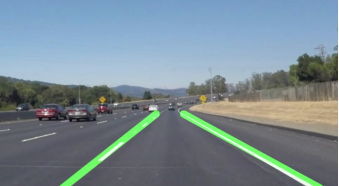

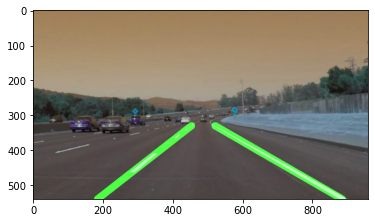

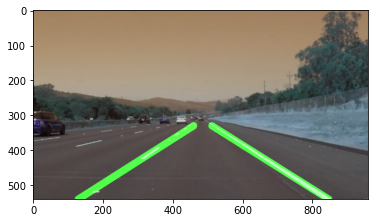

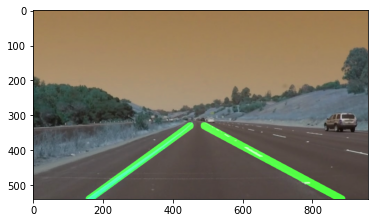

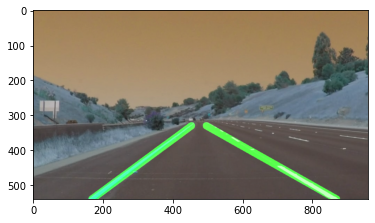

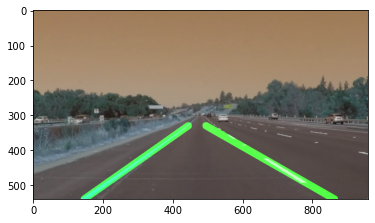

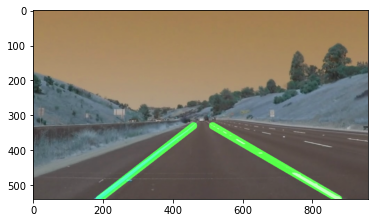

In [59]:
# define variables for merging
α=0.8
β=1.0 
λ=0.0

final_images = list()

# use the addWeighted function to overlay the Hough lines onto the original image
for i in range(len(hough_images)):
    # insert code here. Use cv2.addWeighted to merge the Hough line images to the original image
    final_images.append(cv2.addWeighted(raw_images[i], α, hough_images[i], β, λ))

#display final result

for img in final_images:
    plt.imshow(img)
    plt.show()

In [72]:
def Hough_Lines_print(img_array, print_blur = True, print_canny = True, print_hough = True):
    grey_images = [cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) for image in img_array]
        
    kernel_size = (15, 15)
    img_blur = [cv2.GaussianBlur(img_gray, kernel_size, 0) for img_gray in grey_images]
    
    if print_blur:
        for img in img_blur:
            plt.imshow(img)
            plt.show()
        
    canny_low_threshold = 20
    canny_high_threshold = 100
    canny_images = [cv2.Canny(img_threshold, canny_low_threshold, canny_high_threshold) for img_threshold in img_blur]
    
    if print_canny:
        for img in canny_images:
            plt.imshow(img)
            plt.show()
    
    vertices = np.array([[(0,img_array[0].shape[0]),(450, 310), 
                              (490, 310),(img_array[0].shape[1],img_array[0].shape[0])]], dtype=np.int32)

    # apply the mask to the Canny edge images
    masked_images = [region_of_interest(img ,vertices) for img in canny_images]
        
    rho = 1 # distance resolution in pixels of the Hough grid
    theta = np.pi/180 # angular resolution in radians of the Hough grid
    threshold = 10     # minimum number of votes (intersections in Hough grid cell)
    min_line_length = 20 # minimum number of pixels making up a line
    max_line_gap = 1    # maximum gap in pixels between connectable line segments

    hough_images = [hough_lines(img,rho,theta,threshold,min_line_length,max_line_gap) for img in masked_images]
    
    α=0.8
    β=1.0 
    λ=0.0
    
    final_images = list()

    # use the addWeighted function to overlay the Hough lines onto the original image
    for i in range(len(hough_images)):
        # insert code here. Use cv2.addWeighted to merge the Hough line images to the original image
        final_images.append(cv2.addWeighted(raw_images[i], α, hough_images[i], β, λ))
    
    if print_hough:
        for img in final_images:
            plt.imshow(img)
            plt.show()


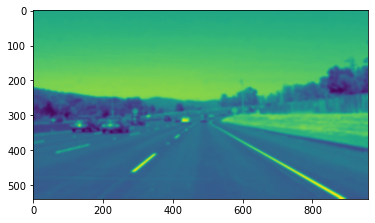

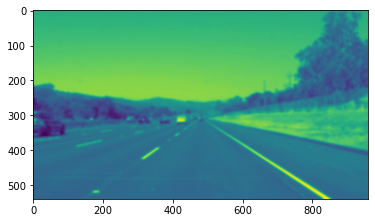

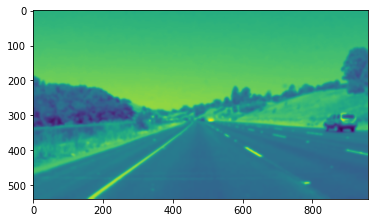

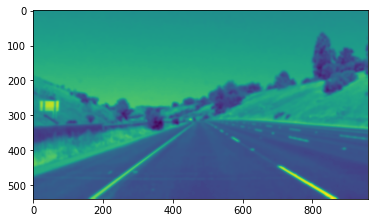

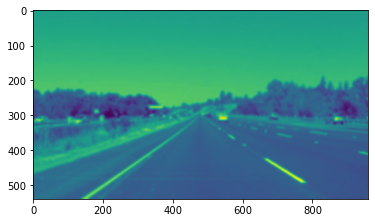

...

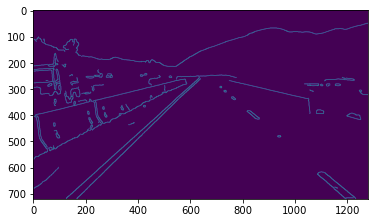

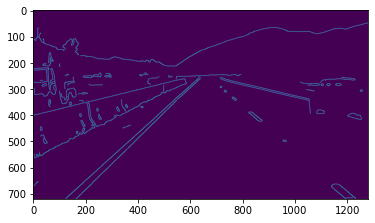

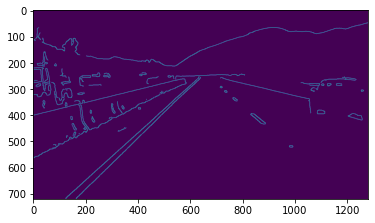

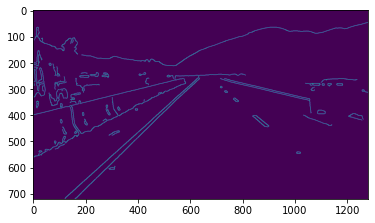

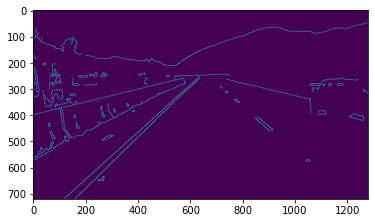

error: OpenCV(4.7.0) :-1: error: (-5:Bad argument) in function 'line'
> Overload resolution failed:
>  - Can't parse 'pt1'. Sequence item with index 0 has a wrong type
>  - Can't parse 'pt1'. Sequence item with index 0 has a wrong type


In [75]:
for i in range(0, 5):
    path = 'images/set_' + str(i+1)+ '/'
    filenames = [path + filename for filename in os.listdir(path)]
    raw_images = [cv2.imread(filename) for filename in filenames]
    
    Hough_Lines_print(raw_images)

## Summary of findings

Comment on the performance of the line detector: 
- In what scenarios (i.e. test sets) does it work well?
- In what scenarios (i.e. test sets) does it not work? 
- Comment on why this implementation does not work in some scenarios
- vary the threshold parameters of the Canny edge detector, and comment on the impact on the lane detection performance
- vary the parameters used by the cv2.HoughLinesP function (rho, theta, threshold etc), and comment on the impact on the lane detection performance
- Suggest methods to improve the performance of this lane detector. Specifically, consider how you would make the detector more robust against changes in contrast, lighting etc

## Extra credit

To receive an extra two marks for this assignment, complete __ONE__ of the following tasks:
- Add a check to reject bad line detections. Hint: consider the slope of the detected lines
- Modify the code to handle the "set_5" images. This is a more challenging set, where the road surface and contrast changes